
# TensorFlow Object Detection: подготовка данных для обучения

### Монтирование Google Drive


In [5]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [6]:
!ls /content/drive

MyDrive


### Рабочая директория
Все данные будем хранить в директории `/content/drive/My Drive/tf_od_demo` (TensorFlow Object Detection Demo).

При первом запуске создайте директорию (если её ещё не существует), в противном случае замените True на False.

При последующих подключениях к диску (в том числе в других ноутбуках) директорию создавать не надо, в ней уже будут сохранены все данные, которые вы туда поместили.

In [7]:

!mkdir "/content/drive/My Drive/tf_od_demo"
%cd "/content/drive/My Drive/tf_od_demo"

mkdir: cannot create directory ‘/content/drive/My Drive/tf_od_demo’: File exists
/content/drive/My Drive/tf_od_demo


## 1. Установка всех необходимых библиотек

Подробнее: https://github.com/tensorflow/models/tree/master/research/object_detection

In [8]:
#install tfslim
!pip install tf_slim
#nstall pycocotools
!pip install pycocotools

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [9]:
import tensorflow as tf

**Клонируйте репозиторий официальных моделей**

In [10]:
! pip install tf-models-official

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 63.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 240.6/240.6 kB 31.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 630.1/630.1 kB 54.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 591.0/591.0 kB 59.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.9/118.9 kB 15.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 89.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 77.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 4.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 18.7 MB/s eta 0:00:00
  Created wheel for seqeval: filename=seqeval-1.2.2-py3-none-any.whl size=16180 sha256=1736ea7c155c15e04633de66875ab161cb5c009b4e993072f16

In [11]:
import os
import pathlib

In [12]:

if  "models"  in pathlib.Path.cwd().parts:
   while  "models"  in pathlib.Path.cwd().parts:
    os.chdir('..')
elif  not pathlib.Path('models').exists():
	!git clone --depth 1 https://github.com/tensorflow/models

**Преобразование файлов PROTO в файлы Python**

In [13]:
!pwd

/content/drive/MyDrive/tf_od_demo


In [14]:
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.

In [15]:
!ls

models	my_data


**Установка библиотеки обнаружения объектов**

In [16]:
!pip install tensorflow-object-detection-api

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 577.4/577.4 kB 32.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.2/121.2 kB 17.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.4/48.4 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.9/84.9 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 25.5 MB/s eta 0:00:00
  Created wheel for tensorflow-object-detection-api: filename=tensorflow_object_detection_api-0.1.1-py3-none-any.whl size=844510 sha256=7f3ef6c228f101e9b24b67147e96c30883b7ceab9cef84c7318e148298dfaf2a
  Stored in directory: /root/.cache/pip/wheels/38/6f/73/3c0c70f9a8219c31c96c495b686af1416154b60707fd96a4cd
Successfully built tensorflow-object-detection-api


**Импорт всех необходимых пакетов**

In [17]:
#Import the necessary packages
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile
from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display

#Import the object detection modules
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

**Настройка некоторых исправлений для TF2 из TF1**

In [18]:
#patch tf1 into `utils.ops`
utils_ops.tf = tf.compat.v1
#Patch the location of gfile
tf.gfile = tf.io.gfile

**Загрузчик моделей и функция загрузки**

In [19]:
def  load_model(model_name):
	base_url =  'http://download.tensorflow.org/models/object_detection/tf2/20200711/'
	model_file = model_name +  '.tar.gz'
	model_dir = tf.keras.utils.get_file(
	fname=model_name,
	origin=base_url + model_file,
	untar=True)
	model_dir = pathlib.Path(model_dir)/"saved_model"
	model = tf.saved_model.load(str(model_dir))
	return model

**Загрузка карты меток**

In [20]:
PATH_TO_LABELS =  'models/research/object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

**Переходим к части обнаружения**

In [21]:
import pathlib

In [22]:
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('models/research/object_detection/test_images')
TEST_IMAGE_PATHS =  sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))
TEST_IMAGE_PATHS

[PosixPath('models/research/object_detection/test_images/image1.jpg'),
 PosixPath('models/research/object_detection/test_images/image2.jpg'),
 PosixPath('models/research/object_detection/test_images/image3.jpg')]

**Выбор модели из Model Zoo**

In [23]:
model_name =  "ssd_mobilenet_v2_320x320_coco17_tpu-8"
detection_model = load_model(model_name)

46042990/46042990 [==============================] - 0s 0us/step


**Проверка подписи моделей, то есть выходных форм, типов данных и входных данных**

In [24]:
print(detection_model.signatures['serving_default'].inputs)
detection_model.signatures['serving_default'].output_dtypes
detection_model.signatures['serving_default'].output_shapes

[<tf.Tensor 'input_tensor:0' shape=(1, None, None, 3) dtype=uint8>, <tf.Tensor 'unknown:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_0:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_1:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_2:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_3:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_4:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_5:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_6:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_7:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_8:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_9:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_10:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_11:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_12:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_13:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_14:0' shape=<unknown> dtype=resource>, <

{'detection_boxes': TensorShape([1, 100, 4]),
 'detection_anchor_indices': TensorShape([1, 100]),
 'raw_detection_boxes': TensorShape([1, 1917, 4]),
 'detection_scores': TensorShape([1, 100]),
 'num_detections': TensorShape([1]),
 'detection_multiclass_scores': TensorShape([1, 100, 91]),
 'raw_detection_scores': TensorShape([1, 1917, 91]),
 'detection_classes': TensorShape([1, 100])}

**Использование функции для загрузки и выполнения прогнозирования**

In [25]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # Входные данные должны быть тензором, преобразуйте их с помощью `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # Модель ожидает пакет изображений, поэтому добавьте ось с помощью `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Выполнить вывод
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)

  # Все выходные данные являются пакетами тензоров.
  # Преобразуйте в массивы numpy и возьмите индекс [0], чтобы удалить пакетное измерение.
  # Нас интересуют только первые num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes должны быть целые.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
  # Обрабатывайте модели с масками:
  if 'detection_masks' in output_dict:
    # Измените рамку маски поля в соответствии с размером изображения.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])      
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
  return output_dict

**Запуск модуля обнаружения объектов с некоторыми тестовыми изображениями**

В папке обнаружения объектов есть папка под названием «Тестовые изображения» с несколькими изображениями.

In [26]:
def show_inference(model, image_path):
  # представление изображения на основе массива будет использовано позже для подготовки
  # конечного изображения с боксами и надписями на нем.
  image_np = np.array(Image.open(image_path))
  # Фактическое обнаружение.
  output_dict = run_inference_for_single_image(model, image_np)
  # Визуализация результатов обнаружения.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)

  display(Image.fromarray(image_np))

**Отображение окончательных результатов**

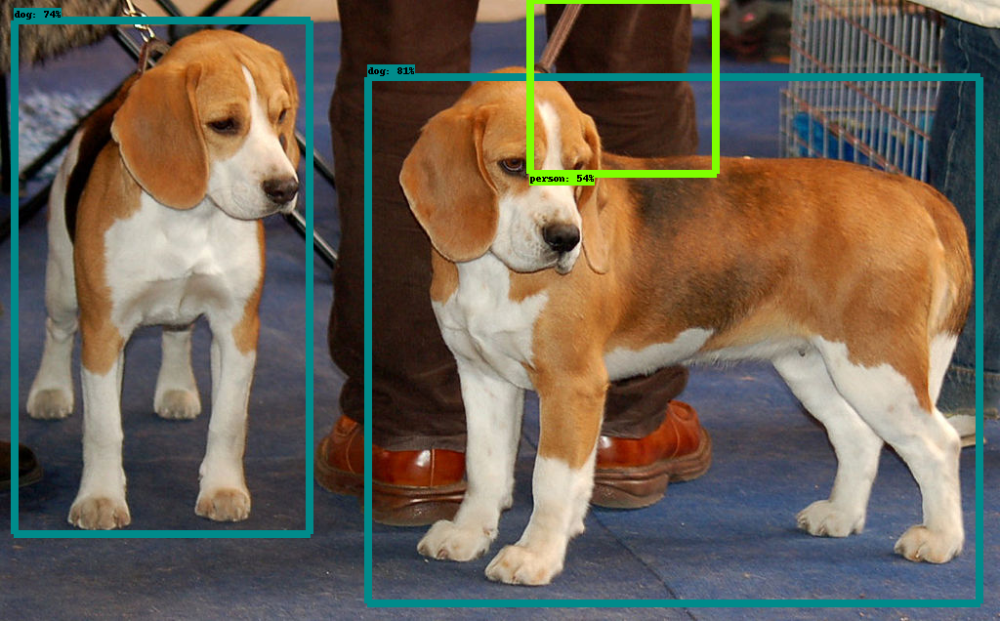

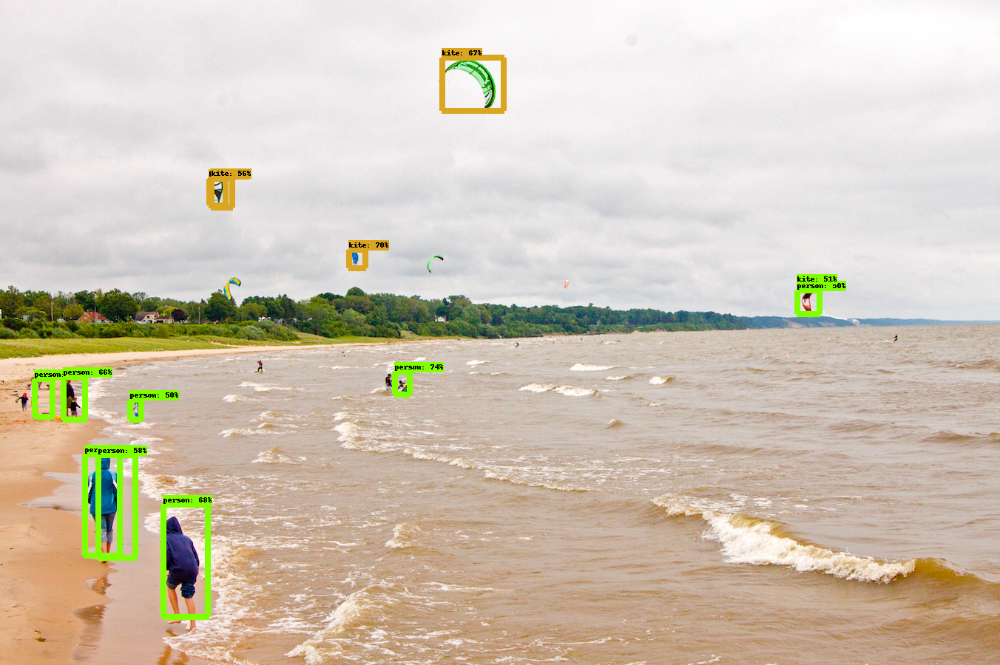

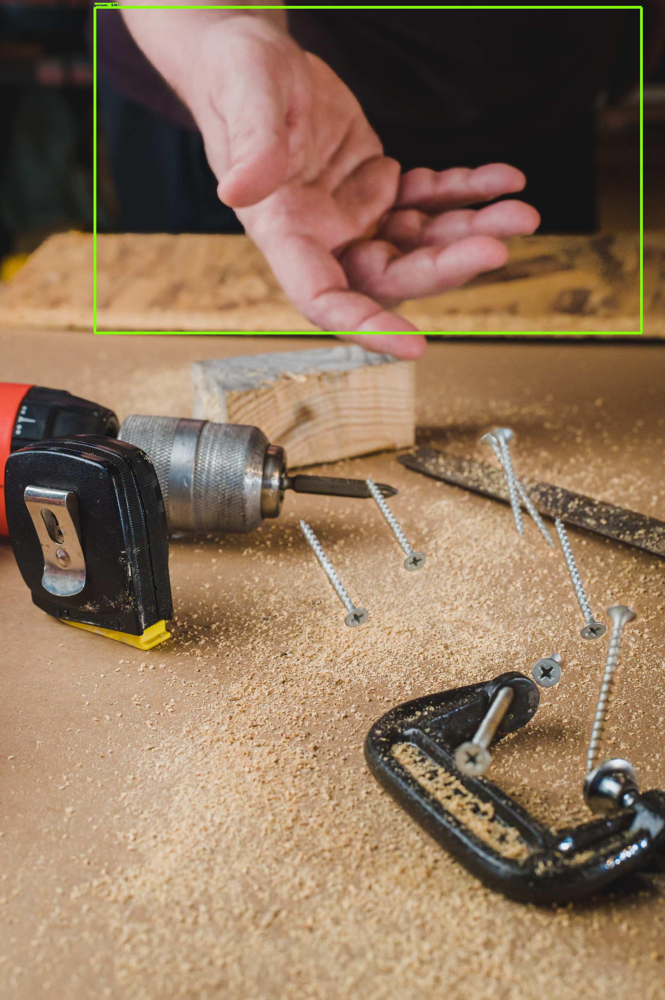

In [27]:
for image_path in TEST_IMAGE_PATHS:
  show_inference(detection_model, image_path)

##2. Подготовка набора данных для пользовательского обучения

**Подключение Google Диска к Colab**

**Создание Labelmap.pbtxt**

In [45]:
if True:
    !7z x my_data.zip


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan         
ERROR: No more files
my_data.zip



System ERROR:
Unknown error -2147024872


In [46]:
PATH_TO_LABELS = 'my_data/cube_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

**Создание TFRecord**

In [47]:
#Import the necessary packages
import pandas as pd

In [48]:
annot = pd.read_csv('my_data/annot.csv')
annot.head()

,id,xmin,ymin,xmax,ymax
0,photo_1.jpg,239,331,453,720
1,photo_2.jpg,282,415,391,626
2,photo_3.jpg,243,277,614,731
3,photo_4.jpg,168,237,570,663
4,photo_5.jpg,306,352,449,689


Здесь мы создаём финальный датасет в формате `TFRecord`, который необходим для запуска обучения TF Object Detection. 

В цикле по всем обучающим образцам создаём `TF Example` и записываем его в `TF Record`.

In [32]:
from object_detection.utils import dataset_util

In [33]:
def create_tf_example(example):
  
    img_fpath = os.path.join('my_data', example.id)
    img = Image.open(img_fpath)
    height = img.size[1]
    width = img.size[0]
    filename = str.encode(example.id)
    with open(img_fpath, mode='rb') as f:
        encoded_image_data = f.read()
    image_format = b'jpeg'

    # List of normalized left x coordinates in bounding box (1 per box)
    xmins = [example.xmin / float(width)] 
    # List of normalized right x coordinates in bounding box # (1 per box)
    xmaxs = [example.xmax / float(width)] 
    # List of normalized top y coordinates in bounding box (1 per box)
    ymins = [example.ymin / float(height)] 
    # List of normalized bottom y coordinates in bounding box # (1 per box)
    ymaxs = [example.ymax / float(height)] 
    # List of string class name of bounding box (1 per box)
    classes_text = [b'Cube']
    # List of integer class id of bounding box (1 per box)
    classes = [1]

    tf_example = tf.train.Example(features=tf.train.Features(feature={
        'image/height': dataset_util.int64_feature(height),
        'image/width': dataset_util.int64_feature(width),
        'image/filename': dataset_util.bytes_feature(filename),
        'image/source_id': dataset_util.bytes_feature(filename),
        'image/encoded': dataset_util.bytes_feature(encoded_image_data),
        'image/format': dataset_util.bytes_feature(image_format),
        'image/object/bbox/xmin': dataset_util.float_list_feature(xmins),
        'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs),
        'image/object/bbox/ymin': dataset_util.float_list_feature(ymins),
        'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs),
        'image/object/class/text': dataset_util.bytes_list_feature(classes_text),
        'image/object/class/label': dataset_util.int64_list_feature(classes),
    }))
    return tf_example

In [49]:
writer = tf.io.TFRecordWriter('my_data/train_data.record')

for idx, row in annot.iterrows():
    tf_example = create_tf_example(row)
    writer.write(tf_example.SerializeToString())

writer.close()

**Получаем конфигурационный файл и вносим необходимые изменения**

**Начнём обучение**

In [35]:
!pip install lvis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [36]:
!pip install tensorflow_io

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.0/28.0 MB 44.8 MB/s eta 0:00:00


In [37]:
!export PYTHONPATH=$PYTHONPATH:`pwd`:`pwd`/slim

In [50]:
%%time

if False:
      # Delete output directory
      !rm my_data/output

!export PYTHONPATH=$PYTHONPATH:models/research:models/research/slim ; python models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path=my_data/pipeline.config \
    --model_dir=my_data/output \
    --num_train_steps=10000 \
    --alsologtostderr

2023-04-19 09:50:21.109652: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.9/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
2023-04-19 09:50:24.984950: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I0419 09:50:25.005944 140203186898752 mirr

**Оценка модели**

In [39]:

!export PYTHONPATH=$PYTHONPATH:models/research:models/research/slim ; python models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path=my_data/pipeline.config \
    --model_dir=my_data/output \
    --max_number_of_evaluations=1 \
    --checkpoint_dir=my_data/output

2023-04-19 09:45:03.218364: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Traceback (most recent call last):
  File "/content/drive/MyDrive/tf_od_demo/models/research/object_detection/model_main_tf2.py", line 30, in <module>
    import tensorflow.compat.v2 as tf
  File "/usr/local/lib/python3.9/dist-packages/tensorflow/__init__.py", line 37, in <module>
    from tensorflow.python.tools import module_util as _module_util
  File "/usr/local/lib/python3.9/dist-packages/tensorflow/python/__init__.py", line 105, in <module>
    from tensorflow.python.platform import test
  File "/usr/local/lib/python3.9/dist-packages/tensorflow/python/platform/test.py", line 20, in <module>
    from tensorflow.python.framework import test_util as _test_util
  File "/usr/local/lib/python3.9/dist-packages/tensorflow/python/framework/test_util.py", line 33, in <module>
    from absl.testing import parameterized
  File "/usr/local/lib/python3.9/dist-packages/abs

**Экспорт графика**

In [40]:
!export PYTHONPATH=$PYTHONPATH:models/research:models/research/slim ; python models/research/object_detection/exporter_main_v2.py \
      --input_type image_tensor \
      --pipeline_config_path my_data/pipeline.config \
      --trained_checkpoint_dir my_data/output \
      --output_directory exported-models/my_model

2023-04-19 09:45:07.444246: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Traceback (most recent call last):
  File "/content/drive/MyDrive/tf_od_demo/models/research/object_detection/exporter_main_v2.py", line 104, in <module>
    from object_detection import exporter_lib_v2
  File "<frozen importlib._bootstrap>", line 1007, in _find_and_load
  File "<frozen importlib._bootstrap>", line 986, in _find_and_load_unlocked
  File "<frozen importlib._bootstrap>", line 680, in _load_unlocked
  File "<frozen importlib._bootstrap_external>", line 846, in exec_module
  File "<frozen importlib._bootstrap_external>", line 941, in get_code
  File "<frozen importlib._bootstrap_external>", line 1040, in get_data
KeyboardInterrupt
^C


**Выполнение прогнозирования на основе пользовательской обученной модели**

In [41]:
def load_custom_model(model_name):
  model_file = model_name
  model_dir = pathlib.Path(model_file)/"saved_model"
  model = tf.saved_model.load(str(model_dir))
  return model

In [42]:
PATH_TO_LABELS = 'my_data/cube_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

In [43]:
import pathlib
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('my_data')
TEST_IMAGE_PATHS =  sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))
TEST_IMAGE_PATHS

[PosixPath('my_data/photo_1.jpg'),
 PosixPath('my_data/photo_10.jpg'),
 PosixPath('my_data/photo_11.jpg'),
 PosixPath('my_data/photo_12.jpg'),
 PosixPath('my_data/photo_13.jpg'),
 PosixPath('my_data/photo_14.jpg'),
 PosixPath('my_data/photo_15.jpg'),
 PosixPath('my_data/photo_16.jpg'),
 PosixPath('my_data/photo_17.jpg'),
 PosixPath('my_data/photo_18.jpg'),
 PosixPath('my_data/photo_19.jpg'),
 PosixPath('my_data/photo_2.jpg'),
 PosixPath('my_data/photo_20.jpg'),
 PosixPath('my_data/photo_21.jpg'),
 PosixPath('my_data/photo_22.jpg'),
 PosixPath('my_data/photo_23.jpg'),
 PosixPath('my_data/photo_24.jpg'),
 PosixPath('my_data/photo_3.jpg'),
 PosixPath('my_data/photo_4.jpg'),
 PosixPath('my_data/photo_5.jpg'),
 PosixPath('my_data/photo_6.jpg'),
 PosixPath('my_data/photo_7.jpg'),
 PosixPath('my_data/photo_8.jpg'),
 PosixPath('my_data/photo_9.jpg')]

In [1]:
model_name =  "exported-models/my_model"
detection_model = load_custom_model(model_name)

In [ ]:
print(detection_model.signatures['serving_default'].inputs)
detection_model.signatures['serving_default'].output_dtypes
detection_model.signatures['serving_default'].output_shapes

In [ ]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # Входные данные должны быть тензором, преобразуйте их с помощью `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # Модель ожидает пакет изображений, поэтому добавьте ось с помощью `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Выполнить вывод
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)

  # Все выходные данные являются пакетами тензоров.
  # Преобразуйте в массивы numpy и возьмите индекс [0], чтобы удалить пакетное измерение.
  # Нас интересуют только первые num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes должны быть целые.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
  # Обрабатывайте модели с масками:
  if 'detection_masks' in output_dict:
    # Измените рамку маски поля в соответствии с размером изображения.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])      
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
  return output_dict

In [ ]:
def show_inference(model, image_path):
  # представление изображения на основе массива будет использовано позже для подготовки
  # конечного изображения с боксами и надписями на нем.
  image_np = np.array(Image.open(image_path))
  # Фактическое обнаружение.
  output_dict = run_inference_for_single_image(model, image_np)
  # Визуализация результатов обнаружения.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)

  display(Image.fromarray(image_np))

In [ ]:
from keras.utils import image_dataset

In [ ]:
for image_path in TEST_IMAGE_PATHS:
  show_inference(detection_model, image_path)

In [ ]:
TEST_IMAGE_PATH = pathlib.Path('my_data/test/test.jpg')

show_inference(detection_model, TEST_IMAGE_PATH)